In [1]:
cd /project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/

/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0


In [2]:
# Adapted from https://nipunbatra.github.io/blog/2014/latexify.html by bin-wu
!PATH=/project/nakamura-lab08/Work/bin-wu/.local/texlive/2018/bin/x86_64-linux:$PATH
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

sns.set_style('white')
sns.set_context('paper')
%matplotlib inline

import matplotlib
from math import sqrt
SPINE_COLOR = 'gray'

def latexify(fig_width=None, fig_height=None, columns=1):
    """Set up matplotlib's RC params for LaTeX plotting.
    Call this before plotting a figure.

    Parameters
    ----------
    fig_width : float, optional, inches
    fig_height : float,  optional, inches
    columns : {1, 2}
    """

    # code adapted from http://www.scipy.org/Cookbook/Matplotlib/LaTeX_Examples

    # Width and max height in inches for IEEE journals taken from
    # computer.org/cms/Computer.org/Journal%20templates/transactions_art_guide.pdf

    assert(columns in [1,2])

    if fig_width is None:
        fig_width = 3.39 if columns==1 else 6.9 # width in inches

    if fig_height is None:
        golden_mean = (np.sqrt(5)-1.0)/2.0    # Aesthetic ratio
        fig_height = fig_width*golden_mean # height in inches

    MAX_HEIGHT_INCHES = 8.0
    if fig_height > MAX_HEIGHT_INCHES:
        print("WARNING: fig_height too large:" + fig_height + 
              "so will reduce to" + MAX_HEIGHT_INCHES + "inches.")
        fig_height = MAX_HEIGHT_INCHES

    font_size=16
    params = {'backend': 'ps',
              'text.latex.preamble': [r'\usepackage{gensymb}'],
              'axes.labelsize': font_size, # fontsize for x and y labels (was 10)
              'axes.titlesize': font_size,
#              'text.fontsize': font_size, # was 10
              'legend.fontsize': font_size, # was 10
              'xtick.labelsize': font_size,
              'ytick.labelsize': font_size,
#              'text.usetex': True,
              'figure.figsize': [fig_width,fig_height],
              'font.family': 'serif',
              #'axes.prop_cycle': matplotlib.cycler(color='bgrcmyk')
              'errorbar.capsize': 4
    }

    matplotlib.rcParams.update(params)


def format_axes(ax):

    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

    for spine in ['left', 'bottom']:
        ax.spines[spine].set_color(SPINE_COLOR)
        ax.spines[spine].set_linewidth(0.5)

    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    for axis in [ax.xaxis, ax.yaxis]:
        axis.set_tick_params(direction='out', color=SPINE_COLOR)

    return ax

latexify()

In [3]:
# sox pair10_animal1_together_hear_1h10min.wav pair10_animal1_together_hear_1h10min_1065s_1075s.wav trim 1065 =1075
# sox 1100F_0124_2017.wav 1100F_0124_2017_0s_10s.wav trim 0 =10
# sox 1100F_0124_2017.wav 1100F_0124_2017_0s_30s.wav trim 0 =30
# sox -v 0.99 1100F_0124_2017.wav -t wav -r 48000 -b 16 - > 1100F_0124_2017_sox_uncompressed.wav # 16 bit for Kaldi extraction
# sox -v 0.99 1100F_0124_2017_0s_10s.wav -t wav -r 48000 -b 16 - > 1100F_0124_2017_0s_10s_sox_uncompressed.wav # 16 bit for Kaldi feature extraction
# sox -v 0.99 1100F_0124_2017_0s_30s.wav -t wav -r 48000 -b 16 - > 1100F_0124_2017_0s_30s_sox_uncompressed.wav # 16 bit for Kaldi feature extraction
path = "/project/nakamura-lab08/Work/bin-wu/workspace/datasets/riken/samples/1100F_0124_2017_0s_10s_sox_uncompressed.wav"
# path = "/project/nakamura-lab08/Work/bin-wu/workspace/datasets/riken/samples/1100F_0124_2017_0s_30s_sox_uncompressed.wav"
# path = "/project/nakamura-lab08/Work/bin-wu/workspace/datasets/riken/samples/pair10_animal1_together_hear_1h10min_1065s_1075s.wav"

In [4]:
import kaldi_io
raw_mfcc13_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mfcc13/raw.scp"
mfcc13_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mfcc13/feats.scp"
mfcc39_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mfcc39/feats.scp"
mfcc40_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mfcc40/feats.scp"
mfcc80_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mfcc80/feats.scp"

raw_mel13_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mel13/raw.scp"
mel13_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mel13/feats.scp"
mel39_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mel39/feats.scp"
mel80_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mel80/feats.scp"
mel80_delta1_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mel80_delta1/feats.scp"
mel80_delta2_scp="/project/nakamura-lab08/Work/bin-wu/workspace/projects/clib/egs/riken/s0/data/riken_sample_mel80_delta2/feats.scp"

raw_mfcc13_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(raw_mfcc13_scp)}
mfcc13_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mfcc13_scp)}
mfcc39_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mfcc39_scp)} # 13 + delta + delta
mfcc40_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mfcc40_scp)}
mfcc80_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mfcc80_scp)}

raw_mel13_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(raw_mel13_scp)}
mel13_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mel13_scp)}
mel39_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mel39_scp)} # 13 + delta + delta
mel80_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mel80_scp)}
mel80_delta1_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mel80_delta1_scp)}
mel80_delta2_feats = {key: mat for key, mat in kaldi_io.read_mat_scp(mel80_delta2_scp)}
for key, mat in kaldi_io.read_mat_scp(mel80_scp):
    print(key)

utt_key = "1100F_0124_2017_0s_10s" 

################################################################################
### WARNING, path does not exist: KALDI_ROOT=/mnt/matylda5/iveselyk/Tools/kaldi-trunk
###          (please add 'export KALDI_ROOT=<your_path>' in your $HOME/.profile)
###          (or run as: KALDI_ROOT=<your_path> python <your_script>.py)
################################################################################



1100F_0124_2017
1100F_0124_2017_0s_10s
1100F_0124_2017_0s_30s


In [5]:
sampling_rate = 48000
spectrum_type="linear"
n_fft=512 # for librosa.stft (default 2048; 512 recommended for speech feature extraction)

# Spectrum (can skip) 

shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000


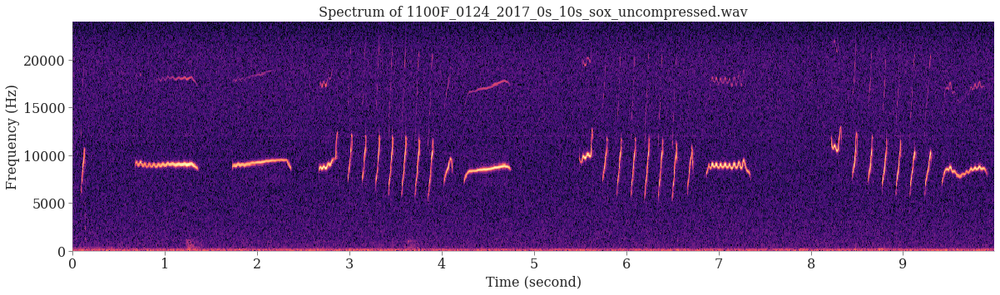

In [6]:
import os
def librosa_spectrum(path=None, n_fft=512, sampling_rate=48000, spectrum_type="linear", title=None):
    import numpy as np
    import matplotlib.pyplot as plt

    import librosa
    import librosa.display
    
    fft_window_size = n_fft # win_length: If unspecified for librosa.stft, defaults to ``win_length = n_fft``.
    fft_window_shift = fft_window_size // 4 # hop_length: If unspecified for librosa.stft, defaults to ``win_length // 4`` (see below).

   
    time_type="s"  # "time" or "ms"
    
    wav, sampling_rate = librosa.load(path, sr=sampling_rate)
    fft_coeff = librosa.stft(wav, n_fft=n_fft, window='hann', center=False) # center=False padding ignored
    spectrum_db = librosa.amplitude_to_db(np.abs(fft_coeff), ref=np.max)
    
    print("shape of wav: {}".format(wav.shape))
    print("shape of STFT: {}".format(fft_coeff.shape))
    print("window size (win_length) for STFT: {}".format(fft_window_size)) 
    print("window shift (hop_length) for STFT: {}".format(fft_window_shift))
    print("number of samples: {}; samples processing by STFT(window_size+window_shift(num_frames-1)): {}+{}*({}-1)={}".format(len(wav), fft_window_size, fft_window_shift, fft_coeff.shape[1], fft_window_size+fft_window_shift*(fft_coeff.shape[1]-1)))

    fig = plt.figure(figsize=(14*1.2, 4.2*1.2))
    ax = fig.add_subplot(111)

    img = librosa.display.specshow(spectrum_db, sr=sampling_rate, hop_length=fft_window_shift, y_axis=spectrum_type, x_axis=time_type, ax=ax, cmap='magma')
    # img = librosa.display.specshow(spectrum_db, y_axis="linear", ax=ax, cmap='viridis')

    ax.set_xlabel("Time (second)")
    ax.set_ylabel("Frequency (Hz)")
    if title: ax.set_title(title)

    plt.tight_layout()
    format_axes(ax)
    # plt.savefig(cur_dir + "/fig/"+measure+"_corp.pdf")

title = "Spectrum of {}".format(os.path.basename(path))
# n_fft = 512 # n_fft=512 recommend for speech (default 2048)
librosa_spectrum(path=path, n_fft=n_fft, sampling_rate=sampling_rate, spectrum_type=spectrum_type, title=title)
# librosa_spectrum(path=path, title=title, spectrum_type=spectrum_type)

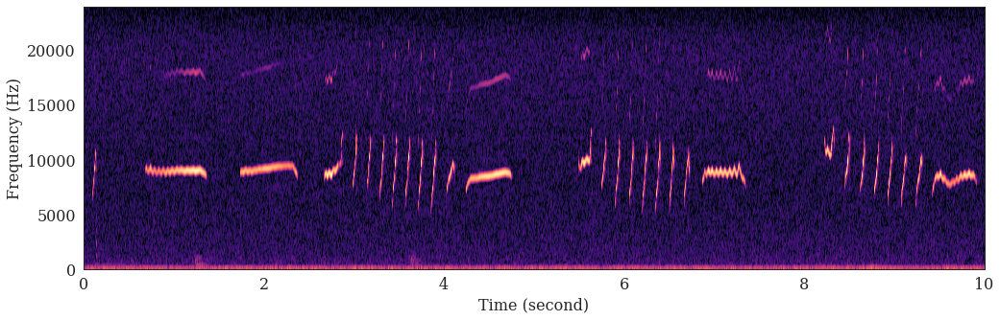

In [7]:
# https://github.com/YannickJadoul/Parselmouth
import parselmouth

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

snd = parselmouth.Sound(path)
def draw_spectrogram(spectrogram, dynamic_range=70):
    X, Y = spectrogram.x_grid(), spectrogram.y_grid()
    sg_db = 10 * np.log10(spectrogram.values)
    plt.pcolormesh(X, Y, sg_db, vmin=sg_db.max() - dynamic_range, cmap='magma')
    # plt.pcolormesh(X, Y, sg_db, vmin=sg_db.max() - dynamic_range, cmap='viridis') # default
    plt.ylim([spectrogram.ymin, spectrogram.ymax]) # log scale?
    plt.xlabel("Time (second)")
    plt.ylabel("Frequency (Hz)")

intensity = snd.to_intensity()
spectrogram = snd.to_spectrogram(maximum_frequency=25000)

plt.figure(figsize=(14*1.2, 4.2*1.2))
draw_spectrogram(spectrogram)
plt.xlim([snd.xmin, snd.xmax])
plt.show()

# Feature analysis

<ipython-input-8-8a70ee44b9d4>:30: FutureWarning: Pass y=[ 0.00146484  0.0015564   0.00134277 ... -0.00065613 -0.00123596
 -0.00028992] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  feat = librosa.feature.mfcc(wav, sr=sampling_rate, n_mfcc=13, dct_type=2, norm='ortho')


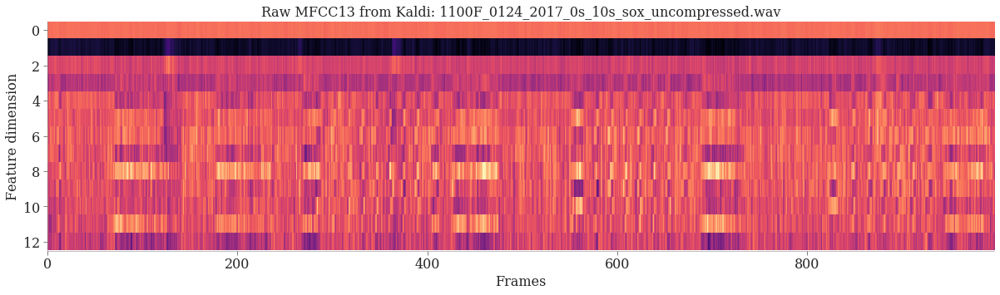

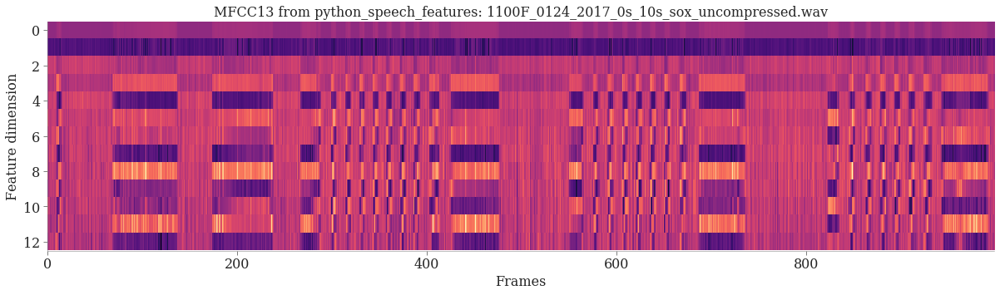

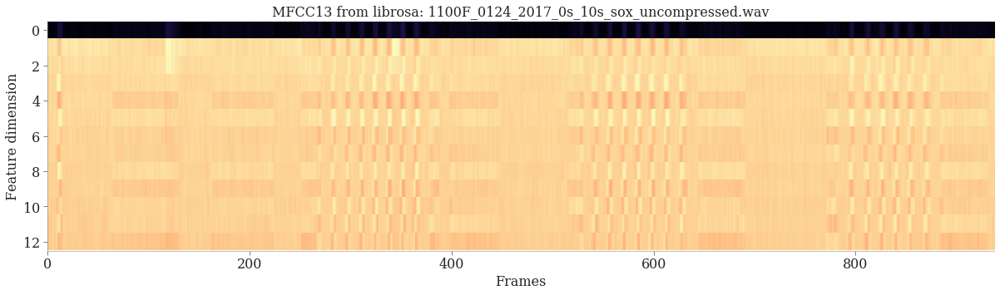

In [8]:
import python_speech_features
import librosa

feat_matrix = raw_mfcc13_feats[utt_key].T
title="Raw MFCC13 from Kaldi: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

wav, sampling_rate = librosa.load(path, sr=sampling_rate)
feat = python_speech_features.mfcc(wav, samplerate=sampling_rate, appendEnergy=True)

title="MFCC13 from python_speech_features: {}".format(os.path.basename(path))
feat_matrix  = feat.T
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

wav, sampling_rate = librosa.load(path, sr=sampling_rate)
feat = librosa.feature.mfcc(wav, sr=sampling_rate, n_mfcc=13, dct_type=2, norm='ortho')

title="MFCC13 from librosa: {}".format(os.path.basename(path))
feat_matrix  = feat
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000


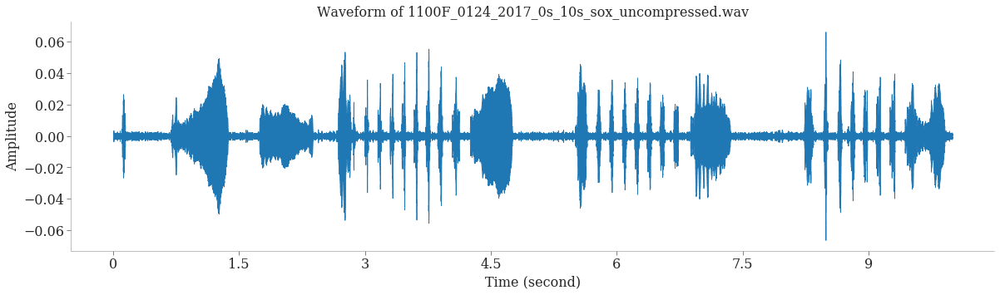

<Figure size 1209.6x362.88 with 0 Axes>

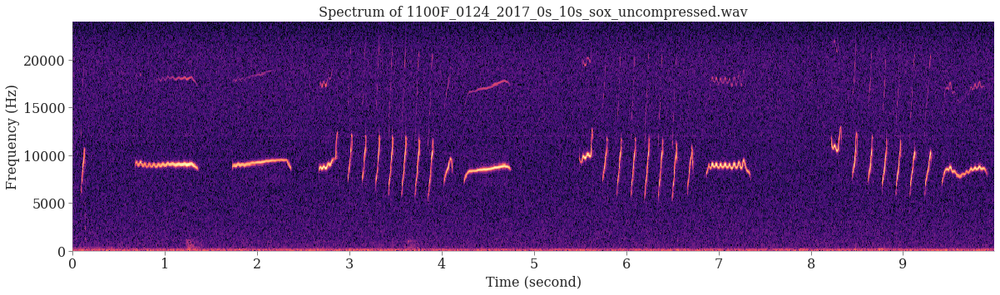

In [9]:
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

title = "Waveform of {}".format(os.path.basename(path))
fig = plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
wav, sampling_rate = librosa.load(path, sr=sampling_rate)
librosa.display.waveshow(wav, x_axis='s', sr=sampling_rate)
ax.set_xlabel("Time (second)")
ax.set_ylabel("Amplitude")
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

title = "Spectrum of {}".format(os.path.basename(path))
plt.figure(figsize=(14*1.2, 4.2*1.2))
librosa_spectrum(path, title=title, spectrum_type=spectrum_type)

# MFCC: MFCC40, and MFCC+Delta+Delta

shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000


<Figure size 1209.6x362.88 with 0 Axes>

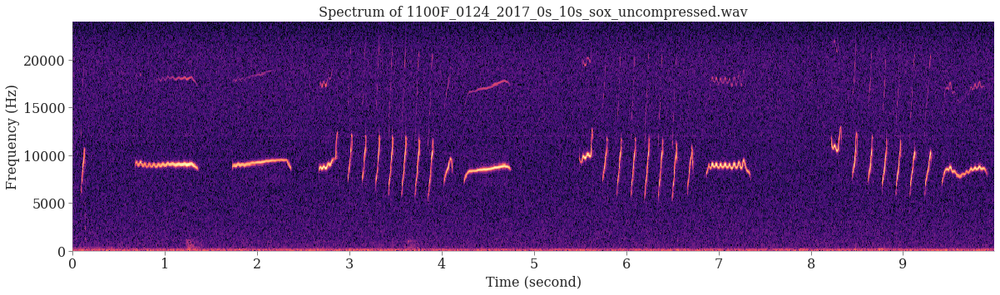

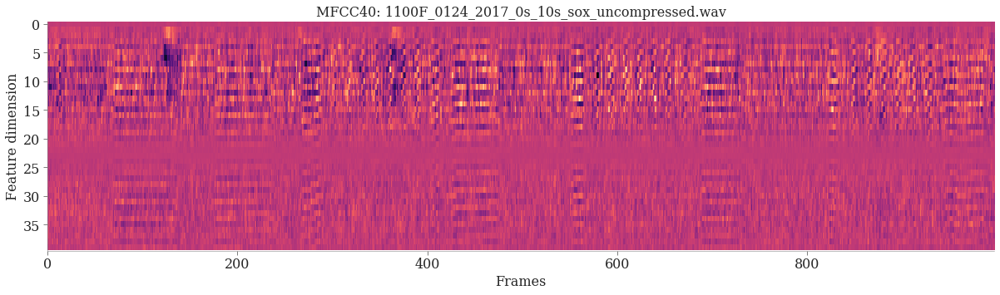

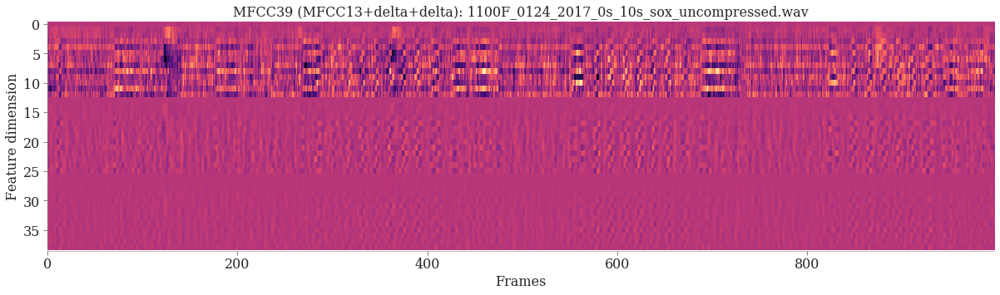

In [10]:
# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

title = "Spectrum of {}".format(os.path.basename(path))
plt.figure(figsize=(14*1.2, 4.2*1.2))
librosa_spectrum(path=path, n_fft=n_fft, sampling_rate=sampling_rate, spectrum_type=spectrum_type, title=title)

feat_matrix = mfcc40_feats[utt_key].T
title="MFCC40: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = mfcc39_feats[utt_key].T
title="MFCC39 (MFCC13+delta+delta): {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

# Mel: Mel80, mel80+delta+delta

shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000
shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000


<Figure size 1209.6x362.88 with 0 Axes>

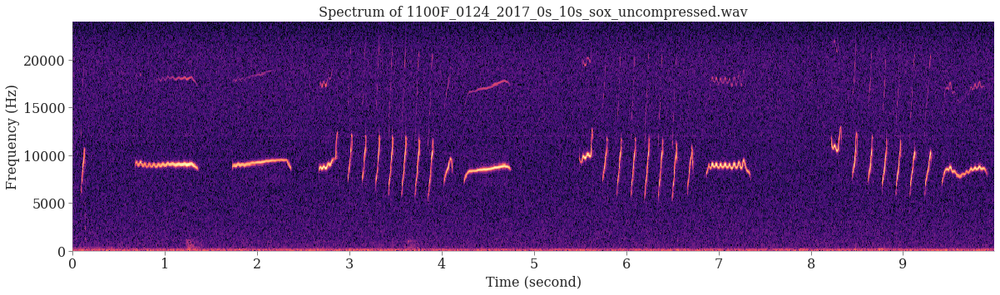

<Figure size 1209.6x362.88 with 0 Axes>

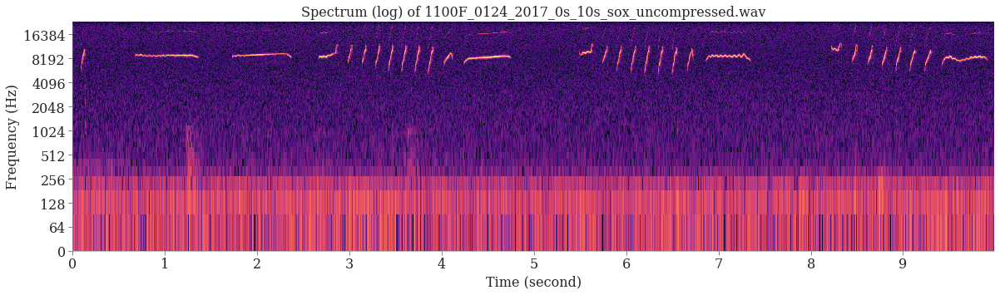

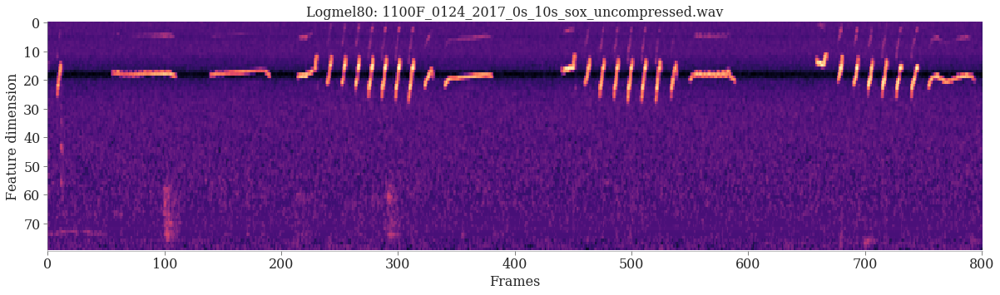

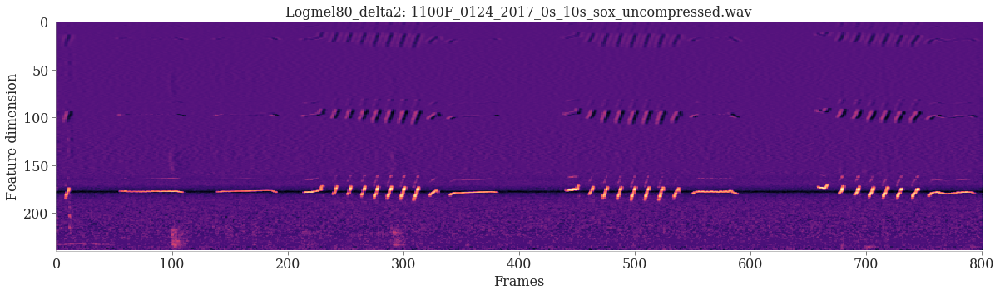

In [11]:
# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

title = "Spectrum of {}".format(os.path.basename(path))
plt.figure(figsize=(14*1.2, 4.2*1.2))
librosa_spectrum(path, title=title, spectrum_type=spectrum_type)

title = "Spectrum (log) of {}".format(os.path.basename(path))
plt.figure(figsize=(14*1.2, 4.2*1.2))
librosa_spectrum(path, title=title, spectrum_type="log")

feat_matrix = np.flip(mel80_feats[utt_key].T, axis=0)
title="Logmel80: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = np.flip(mel80_delta2_feats[utt_key].T, axis=0)
title="Logmel80_delta2: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

# Mel13, mel13+delta+delta, MFCC80 (options might have problem)

shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000


<Figure size 1209.6x362.88 with 0 Axes>

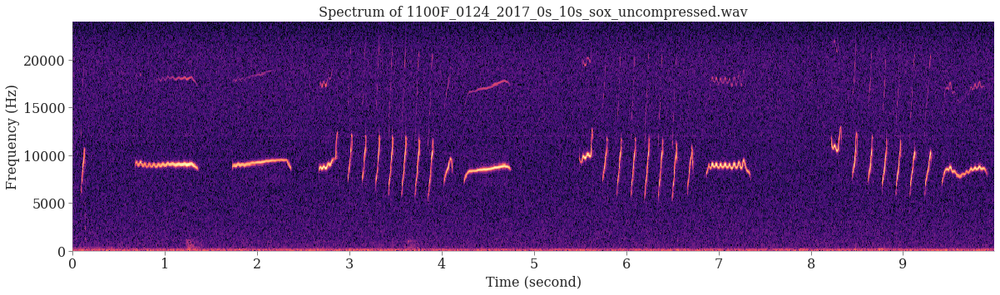

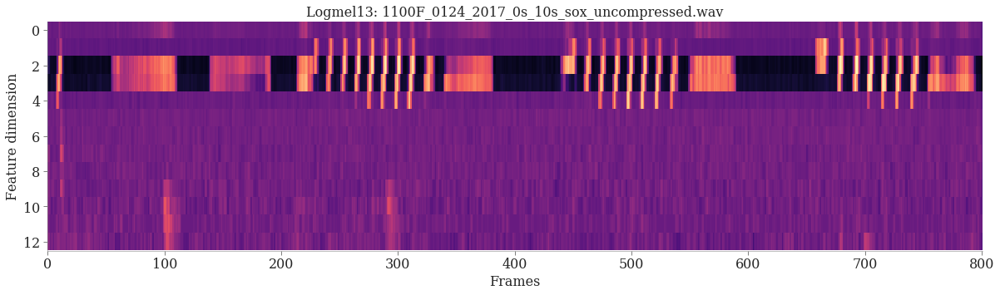

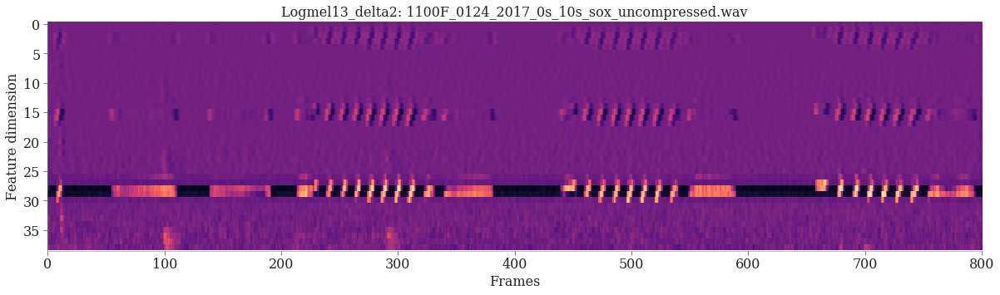

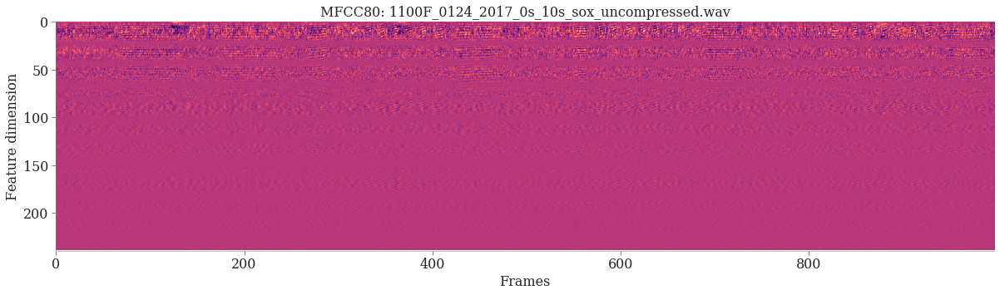

In [12]:
# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

title = "Spectrum of {}".format(os.path.basename(path))
plt.figure(figsize=(14*1.2, 4.2*1.2))
librosa_spectrum(path, title=title, spectrum_type=spectrum_type)

feat_matrix = np.flip(mel13_feats[utt_key].T, axis=0)
title="Logmel13: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = np.flip(mel39_feats[utt_key].T, axis=0)
title="Logmel13_delta2: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = mfcc80_feats[utt_key].T
title="MFCC80: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

# Comparison Delta+Delta from kaldi python_speech_feature and librosa

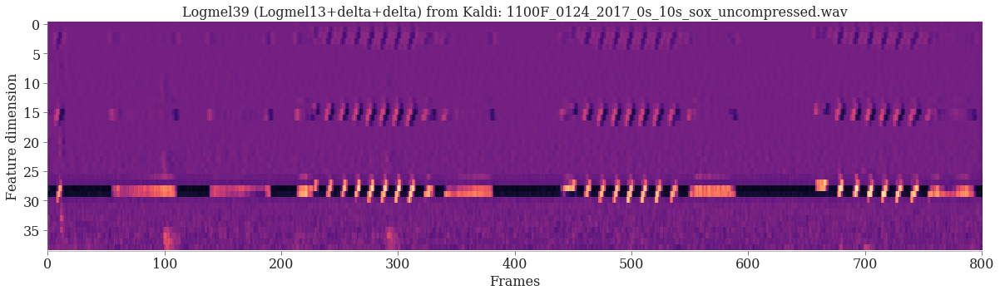

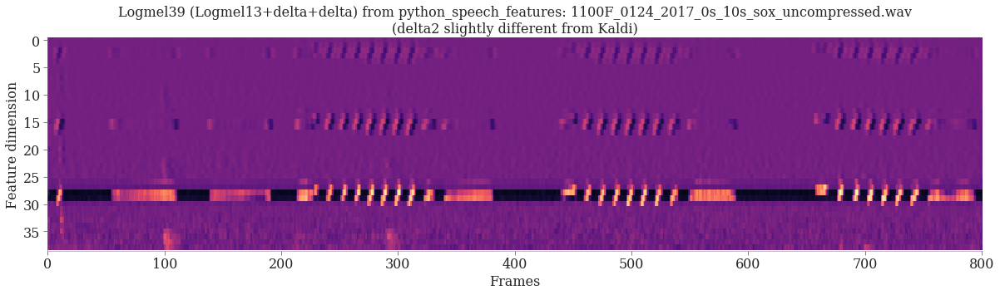

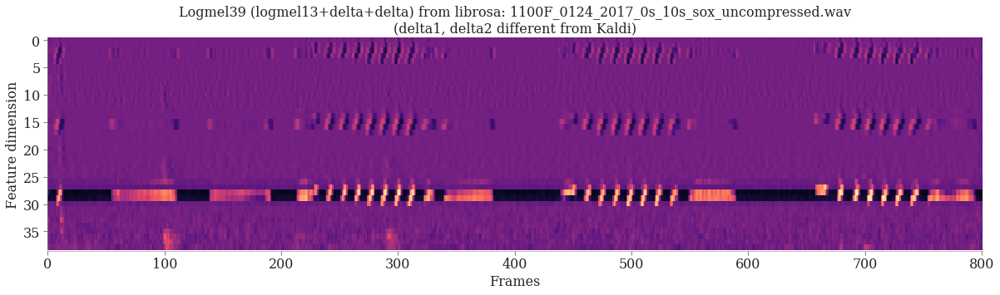

In [13]:
# in kaldi  --delta-window              : Parameter controlling window for delta computation (actual window size for each delta order is 1 + 2*delta-window-size) (int, default = 2)
librosa_delta_delta = np.concatenate([mel13_feats["1100F_0124_2017_0s_10s"].T, librosa.feature.delta(mel13_feats["1100F_0124_2017_0s_10s"].T, width=5, order=1), librosa.feature.delta(mel13_feats["1100F_0124_2017_0s_10s"].T, width=5, order=2)])

import python_speech_features
feat = mel13_feats["1100F_0124_2017_0s_10s"]
feat_delta = python_speech_features.base.delta(feat, N=2)
feat_delta2 = python_speech_features.base.delta(feat_delta, N=2)
python_speech_features_delta_delta = np.concatenate([mel13_feats[utt_key], feat_delta, feat_delta2], axis=1)

feat_matrix = np.flip(mel39_feats[utt_key].T, axis=0)
title="Logmel39 (Logmel13+delta+delta) from Kaldi: {}".format(os.path.basename(path))
fig = plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = np.flip(python_speech_features_delta_delta.T, axis=0)
title="Logmel39 (Logmel13+delta+delta) from python_speech_features: {}\n(delta2 slightly different from Kaldi)".format(os.path.basename(path))
fig = plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = np.flip(librosa_delta_delta, axis=0)
title="Logmel39 (logmel13+delta+delta) from librosa: {}\n(delta1, delta2 different from Kaldi)".format(os.path.basename(path))
fig = plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

# Comparison CMVN Kaldi vs. python

shape of wav: (480000,)
shape of STFT: (257, 3747)
window size (win_length) for STFT: 512
window shift (hop_length) for STFT: 128
number of samples: 480000; samples processing by STFT(window_size+window_shift(num_frames-1)): 512+128*(3747-1)=480000
[ 0.02889863  0.0251256   0.02321556  0.02796126  0.00919403  0.04099619
 -0.02597361 -0.01869854 -0.03258064 -0.13692695 -0.07848398 -0.0365949
 -0.04052404]
[ 0.02889868  0.02512559  0.02321557  0.02796128  0.00919399  0.04099621
 -0.02597367 -0.01869853 -0.03258064 -0.13692704 -0.07848401 -0.03659491
 -0.04052395]


<Figure size 1209.6x362.88 with 0 Axes>

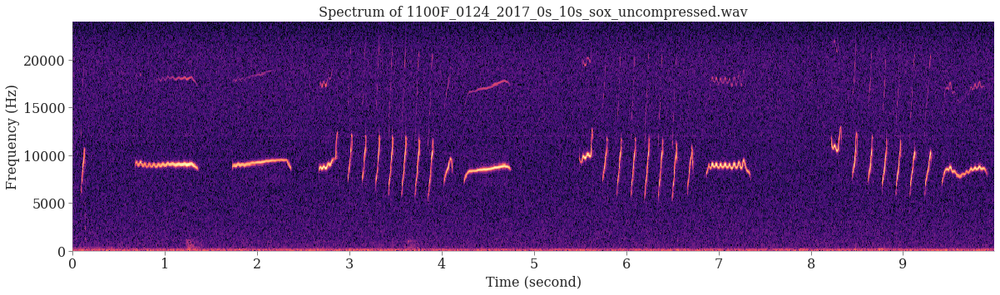

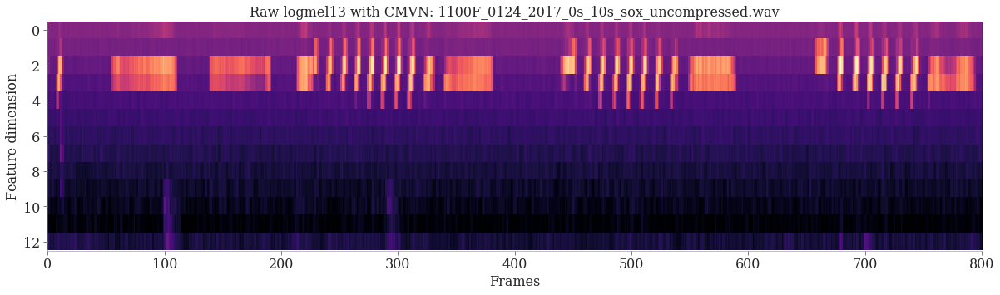

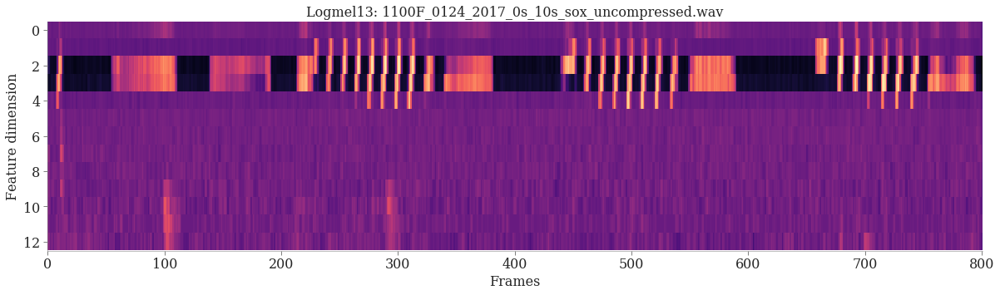

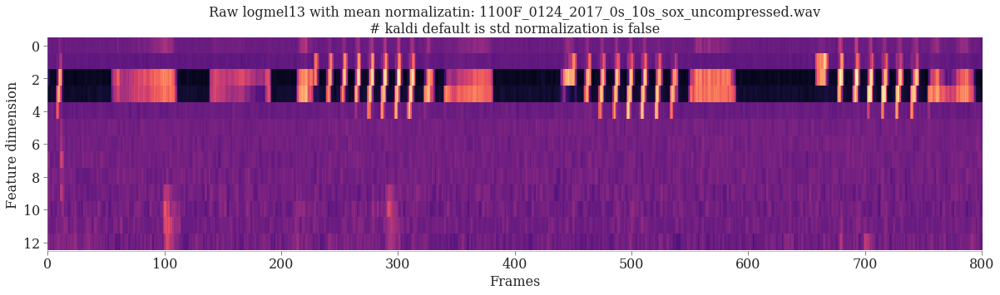

In [14]:
# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

title = "Spectrum of {}".format(os.path.basename(path))
plt.figure(figsize=(14*1.2, 4.2*1.2))
librosa_spectrum(path, title=title, spectrum_type=spectrum_type)

feat_matrix = np.flip(raw_mel13_feats[utt_key].T, axis=0)
title="Raw logmel13 with CMVN: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat_matrix = np.flip(mel13_feats[utt_key].T, axis=0)
title="Logmel13: {}".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

feat = raw_mel13_feats[utt_key] # shape (num_frames, feat_dim)
feat_cmvn = feat - feat.mean(axis=0) # kaldi default is std normalization is false
feat_matrix = np.flip(feat_cmvn.T, axis=0)
title="Raw logmel13 with mean normalizatin: {}\n# kaldi default is std normalization is false".format(os.path.basename(path))
fig =plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = fig.add_subplot(111)
ax.imshow(feat_matrix, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'
ax.set_xlabel("Frames")
ax.set_ylabel("Feature dimension".format(title))
ax.set_title(title)
plt.tight_layout()
format_axes(ax)

print(mel13_feats[utt_key][0])
utt_key = "1100F_0124_2017_0s_10s"
feat_cmvn = feat - feat.mean(axis=0) # kaldi default is std normalization is false
print(feat_cmvn[0])

In [15]:
def DPGMM1(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose=True):
    %matplotlib notebook
    from scipy.stats import multivariate_normal

    z = np.random.choice(K0, len(sources))
    niw_sampler = NormalInverseWishartDistribution(mu0, lmbda, nu, Sigma0)

    # Plot the the initial state of network.
    plt.ion() # Turn on the interactive mode.
    fig = plt.figure(figsize=(6,4))
    ax = fig.add_subplot(111)

    def display_cluster(sources, preds, ax, iteration):
        ax.clear()
        ax.set_title("Iteration {}".format(iteration))
        colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                         '#f781bf', '#a65628', '#984ea3',
                                         '#999999', '#e41a1c', '#dede00']),
                                  int(max(preds) + 1))))
        ax.scatter(sources[:, 0], sources[:, 1], s=10, color=colors[preds])

        fig.canvas.draw()
        fig.canvas.flush_events()



    for iteration in range(num_iterations):
        # sample weights
        clusters, counts = np.unique(z, return_counts=True)
        if verbose: print(f"clusters: {clusters}")
        clusters = np.append(clusters, [clusters.max() + 1]) # 1,....,K, K+1 --- not empty clusters + possible new cluster
        counts = np.append(counts, [alpha]) # n_1,.., n_K, n_{K+1}
        weights = np.random.dirichlet(counts)

        # sample mean and covariance
        parameters = []
        for cluster in clusters[:-1]: # exclude the new K+1 cluster
            parameters.append(niw_sampler.posterior(sources[z==cluster]).sample())
        parameters.append(niw_sampler.sample()) # sample for the K+1 cluster
        means, covs = list(zip(*parameters))

        # sample z
        num_clusters = len(clusters) # number of not empty clusters and possible new one
        num_sources = len(sources)
        assert (len(clusters) == len(means) == len(covs) == len(weights))

#         updated_z = []
#         for i in range(num_sources):
#             z_posterior = []
#             for k in range(num_clusters):
#                 z_posterior.append(scipy.stats.multivariate_normal.pdf(sources[i], mean=means[k], cov=covs[k]) * weights[k])
#             z_posterior = np.array(z_posterior)
#             z_posterior = z_posterior / z_posterior.sum()
#             updated_z.append(np.random.choice(clusters, p=z_posterior))

        z_posterior = []
        for k in range(num_clusters):
            z_posterior.append((multivariate_normal.pdf(sources, mean=means[k], cov=covs[k]) * weights[k]).reshape(-1, 1))
        z_posterior = np.concatenate(z_posterior, axis=1)
        z_posterior = z_posterior / z_posterior.sum(axis=1).reshape(-1, 1)
        
        updated_z = []
        for i in range(num_sources):
            updated_z.append(np.random.choice(clusters, p=z_posterior[i]))

        # update z
        z = np.array(updated_z)
        display_cluster(sources, z, ax, iteration)

In [44]:
from typing import Optional

import os
import sys
import argparse
import logging
logging.basicConfig(stream=sys.stdout,level=logging.INFO, format="[ %(asctime)s | %(filename)s | %(levelname)s ] %(message)s", datefmt="%d/%m/%Y %H:%M:%S")

import numpy as np
from scipy.stats import chi2
from scipy.stats import multivariate_normal

# https://en.wikipedia.org/wiki/Inverse-Wishart_distribution
class NormalInverseWishartDistribution(object):
    def __init__(self, mu, lmbda, nu, psi):
        self.mu = mu
        self.lmbda = float(lmbda)
        self.nu = nu
        self.psi = psi
        self.inv_psi = np.linalg.inv(psi)

    def sample(self):
        sigma = np.linalg.inv(self.wishartrand())
        return (np.random.multivariate_normal(self.mu, sigma / self.lmbda), sigma)

    def wishartrand(self):
        dim = self.inv_psi.shape[0]

        # ###
        # def check_symmetric(a, rtol=1e-05, atol=1e-08):
        #     return np.allclose(a, a.T, rtol=rtol, atol=atol)
        # print(self.psi)
        # print(self.inv_psi)
        # print(check_symmetric(self.psi))
        # print(check_symmetric(self.inv_psi))
        # print(np.linalg.eigvals(self.psi))
        # print(np.linalg.eigvals(self.inv_psi))
        # ###

        chol = np.linalg.cholesky(self.inv_psi)
        foo = np.zeros((dim,dim))

        for i in range(dim):
            for j in range(i+1):
                if i == j:
                    foo[i,j] = np.sqrt(chi2.rvs(self.nu-(i+1)+1))
                else:
                    foo[i,j]  = np.random.normal(0,1)
        return np.dot(chol, np.dot(foo, np.dot(foo.T, chol.T)))

    def posterior(self, data):
        n = len(data)
        mean_data = np.mean(data, axis=0)
        sum_squares = np.sum([np.array(np.matrix(x - mean_data).T * np.matrix(x - mean_data)) for x in data], axis=0)
        mu_n = (self.lmbda * self.mu + n * mean_data) / (self.lmbda + n)
        lmbda_n = self.lmbda + n
        nu_n = self.nu + n
        psi_n = self.psi + sum_squares + self.lmbda * n / float(self.lmbda + n) * np.array(np.matrix(mean_data - self.mu).T * np.matrix(mean_data - self.mu))
        return NormalInverseWishartDistribution(mu_n, lmbda_n, nu_n, psi_n)

def DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose=True, targets=None, sources_test=None, targets_test=None):
    """ Implementation of the DPGMM clustering by the Gibb sampling. (implemented by bin-wu)
    Parameters
    ----------
    alpha: the concentration parameter
    mu0: the prior belief of the mean (np.array with shape [data_dim])
    lmbda: the belief-strength of the mean
    Sigma0: the prior belief of the covariance (np.array with shape [data_dim, data_dim])
    nu: the belief-strength of the covariance (degree of freedom (df)); df>=dim_data+3
    sources: the data (np.array with shape [num_data, data_dim])
    K0: the initial number of the clusters (can be any number)
    num_iterations: number of the iterations
    verbose: print verbose information or not
    targets: for evaluation (np.array with shape [num_data_target])
    sources_test: train model at sources to get parameters, 
        use these parameters to get cluster indicators z, 
        posteriorgram z_posterior and clusters_test for the sources_test
        (np.array with shape [num_data_test, data_dim])
    targets_test: for evaluation of sources_test (np.array with shape [num_data_target])
    Returns
    -------
    NOTE: the num_clusters includes a possible new cluster.
    A dict of key-value:
        {'z': z, 'z_posterior': z_posterior, 'weights': weights, 'means': means, 'covs': covs, 'clusters': clusters}
    z: the sampled hidden cluster indicators of the last iteration (shape [num_data])
    z_posterior: the posterior of all the data (shape [num_data, num_clusters])
    weights: the sampled weights of the last iteration (shape [num_clusters])
    means: the sampled mean of the last iteration (list of np.array with length num_clusters)
    covs: the sampled variance of the last iteration (list of np.array with length num_clusters)
    clusters: the cluster index set of the last iteration (shape [num_clusters]) (not update for sources_test) (from z)
    clusters_test: the cluster index set for the cluster_test (number of clusters_test maybe less than clusters)
    
    Example
    -------
    import scipy
    from sklearn import cluster, datasets
    from itertools import cycle, islice
    n_samples = 1500
    blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
    sources, targets = blobs[0], blobs[1]
    D = sources.shape[1]
    alpha = 1 # concentrate parameter
    mu0 = np.mean(sources, axis = 0)
    lmbda = 1 # belief of the mean
    Sigma0 = np.cov(sources.T) # belief of the covariance; for np.cov(m), each column of m is a single observation
    nu = D + 3 # belief of variance or degree of freedom
    K0=10 # initial number of clusters
    num_iterations = 100
    verbose=True
    results = DPGMM2(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
    # preds = results['z']
    preds = np.argmax(results['z_posterior'], axis=1)
    colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                         '#f781bf', '#a65628', '#984ea3',
                                         '#999999', '#e41a1c', '#dede00']),
                                  int(max(preds) + 1))))
    plt.scatter(sources[:, 0], sources[:, 1], s=10, color=colors[preds])
    plt.show()
    implemented by bin-wu at 15:38 in 2020.02.09
    """
    # randomly initilize the cluster indicator
    z = np.random.choice(K0, len(sources))
    niw_sampler = NormalInverseWishartDistribution(mu0, lmbda, nu, Sigma0)

    for iteration in range(num_iterations):
        # sample the weights
        clusters, counts = np.unique(z, return_counts=True) # counter, remove empty clusters
        num_clusters = len(clusters)
        if verbose: logging.info(f"iter: {iteration} - num_clusters: {num_clusters}")
        clusters = np.append(clusters, [clusters.max() + 1]) # 1,....,K, K+1 --- not empty clusters + possible new cluster
        counts = np.append(counts, [alpha]) # n_1,.., n_K, n_{K+1}
        weights = np.random.dirichlet(counts)

        # sample the mean and the covariance for each Gaussian cluster including the possible new K+1 one
        parameters = []
        for cluster in clusters[:-1]: # exclude the new K+1 cluster
            parameters.append(niw_sampler.posterior(sources[z==cluster]).sample())
        parameters.append(niw_sampler.sample()) # sample for the K+1 cluster
        means, covs = list(zip(*parameters))

        # sample z
        num_clusters = len(clusters) # number of not empty clusters and possible new one
        num_sources = len(sources)
        assert (len(clusters) == len(means) == len(covs) == len(weights))

        z_posterior = []
        for k in range(num_clusters):
            z_posterior.append((multivariate_normal.pdf(sources, mean=means[k], cov=covs[k]) * weights[k]).reshape(-1, 1))
        z_posterior = np.concatenate(z_posterior, axis=1)
        z_posterior = z_posterior / z_posterior.sum(axis=1).reshape(-1, 1)

        updated_z = []
        for i in range(num_sources):
            updated_z.append(np.random.choice(clusters, p=z_posterior[i]))

        # update z
        z = np.array(updated_z)

        # evaluation
        if targets is not None:
            preds = np.argmax(z_posterior, axis=1) # preds = z
            result = metrics.homogeneity_completeness_v_measure(targets, preds)
            if verbose: logging.info('iter: {}, num_clusters: {}, homo: {:.4f}, comp: {:.4f}, v_meas: {:.4f}'.format(iteration, len(clusters), result[0], result[1], result[2]))
    
    clusters_test = None
    if sources_test is not None:
        z_posterior = []
        for k in range(num_clusters):
            z_posterior.append((multivariate_normal.pdf(sources_test, mean=means[k], cov=covs[k]) * weights[k]).reshape(-1, 1))
        z_posterior = np.concatenate(z_posterior, axis=1)
        z_posterior = z_posterior / z_posterior.sum(axis=1).reshape(-1, 1)
        
        num_sources_test = len(sources_test)
        updated_z = []
        for i in range(num_sources_test):
            updated_z.append(np.random.choice(clusters, p=z_posterior[i]))

        # update z
        z = np.array(updated_z)
        
        # update clusters_test
        clusters_test, counts = np.unique(z, return_counts=True) # counter, remove empty clusters
    
    if (sources_test is not None) and (targets_test is not None) and verbose:
        preds_test = np.argmax(z_posterior, axis=1) # preds = z
        result = metrics.homogeneity_completeness_v_measure(targets_test, preds_test)
        if verbose: logging.info('train_iter: {}, num_clusters_test: {}, homo: {:.4f}, comp: {:.4f}, v_meas: {:.4f}'.format(iteration, len(clusters_test), result[0], result[1], result[2]))

    return  {'z': z, 'z_posterior': z_posterior, 'weights': weights, 'means': means, 'covs': covs, 'clusters': clusters, 'clusters_test': clusters_test}

<IPython.core.display.Javascript object>


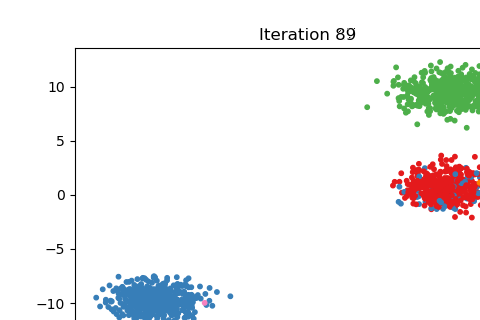

clusters: [0]
clusters: [0 1]
clusters: [0 1 2]
clusters: [0 1 2 3]
clusters: [0 1 2]
clusters: [0 1 2]
clusters: [0 1 2 3]
clusters: [0 1 2 3]
clusters: [0 1 2 3]
clusters: [0 1 2 3 4]
clusters: [0 2 3]
clusters: [0 2 3 4]
clusters: [0 2 5]
clusters: [0 2 6]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2 3]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2 3]
clusters: [0 2 3]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2]
clusters: [0 2 3]
clusters: [0 2 3]
clusters: [0 2 3 4]
clusters: [0 2 4 5]
clusters: [0 2 4 5 6]
clusters: [0 2 4 6]
clusters: [0 2 6]
clusters: [0 2 6]
clusters: [0 2 6]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7 8]
clusters: [0 2 7 9]
clusters: [ 0  2  7 10]
clusters: [ 0  2  7 10]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7]
clusters: [0 2 7

TypeError: 'NoneType' object is not subscriptable

In [45]:
%matplotlib notebook
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=1 # initial number of clusters
num_iterations = 100
verbose=True

results = DPGMM1(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds = np.argmax(results['z_posterior'], axis=1)

colors = np.array(list(islice(cycle(['#377eb8', '#ff7f00', '#4daf4a',
                                     '#f781bf', '#a65628', '#984ea3',
                                     '#999999', '#e41a1c', '#dede00']),
                              int(max(preds) + 1))))
plt.scatter(sources[:, 0], sources[:, 1], s=10, color=colors[preds])
plt.show()

In [46]:
%matplotlib inline
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
print(mfcc40_feats[utt_key].shape)
# print(mel80_feats[utt_key].shape)

sources = mfcc40_feats[utt_key] # (num_frames, feat_dim) 
# sources = mel80_feats[utt_key] 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=3 # initial number of clusters
num_iterations = 1500
verbose=False

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mfcc40 = np.argmax(results['z_posterior'], axis=1)

(998, 40)


In [47]:
preds_mfcc40

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,

(801, 80)
(998, 13)


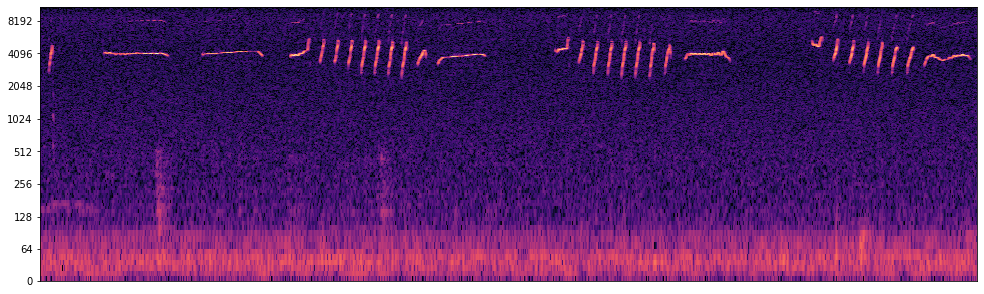

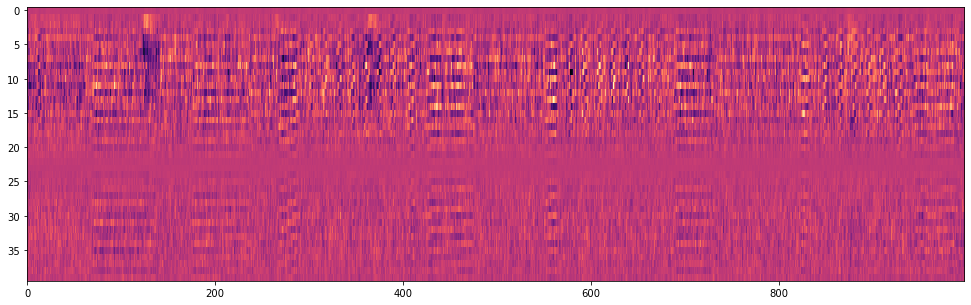

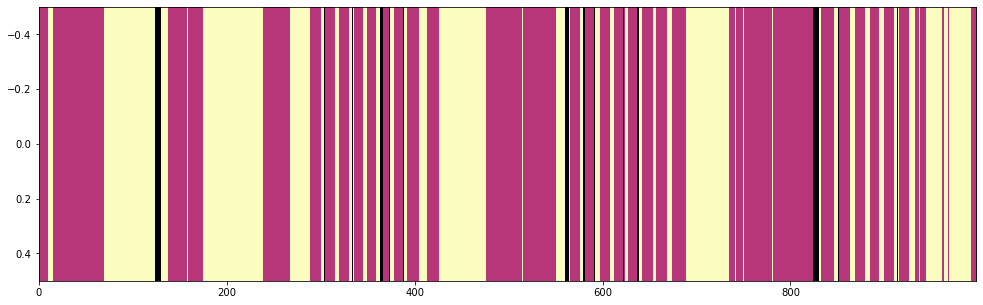

In [48]:
# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

utt_key = "1100F_0124_2017_0s_10s"
print(mel80_feats["1100F_0124_2017_0s_10s"].shape)
print(mfcc13_feats["1100F_0124_2017_0s_10s"].shape)

y, sr = librosa.load(path, sr=48000)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14*1.2, 4.2*1.2))
# draw_spectrogram(spectrogram)
ax = librosa.display.specshow(S_db, cmap='magma', y_axis='log')
plt.gca().set_ylabel(None)# Turn off y labels

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(mfcc40_feats[utt_key].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(preds_mfcc40[:,np.newaxis].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

(998, 40)
[0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 1 2 2 1 2 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1
 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 2 2 2 2 0 0 0
 0 0 2 1 1 1 1 1 0 0 0 0 0 0 0 0 0 2 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1
 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0
 0 0 0 0 0 0 0 

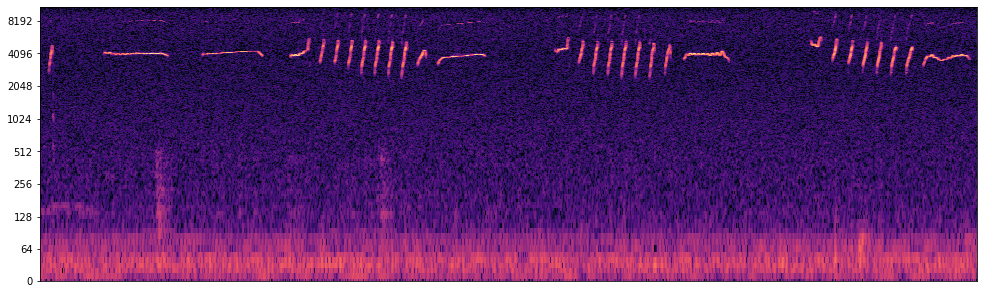

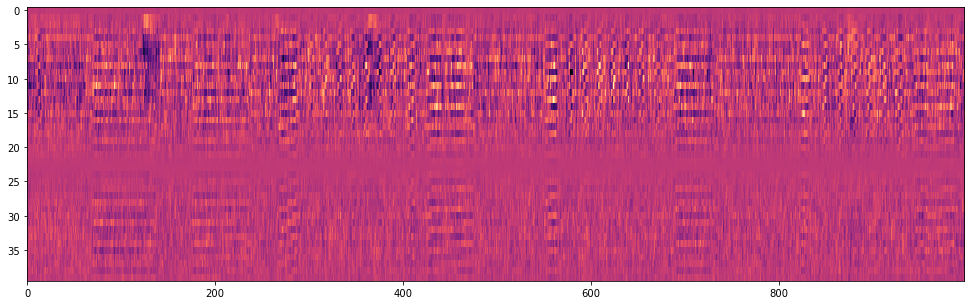

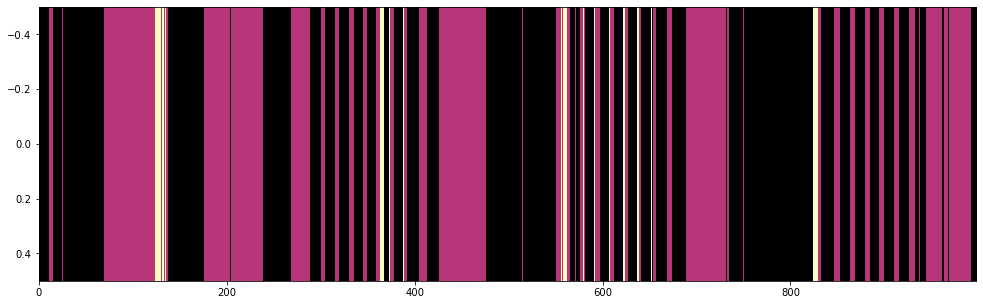

In [207]:
%matplotlib inline
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
print(mfcc40_feats[utt_key].shape)
# print(mel80_feats[utt_key].shape)

sources = mfcc40_feats[utt_key] # (num_frames, feat_dim) 
# sources = mel80_feats[utt_key] 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=3 # initial number of clusters
num_iterations = 1500
verbose=False

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mfcc40 = np.argmax(results['z_posterior'], axis=1)

print(preds_mfcc40)

# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

utt_key = "1100F_0124_2017_0s_10s"
print(mel80_feats["1100F_0124_2017_0s_10s"].shape)
print(mfcc13_feats["1100F_0124_2017_0s_10s"].shape)

y, sr = librosa.load(path, sr=48000)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14*1.2, 4.2*1.2))
# draw_spectrogram(spectrogram)
ax = librosa.display.specshow(S_db, cmap='magma', y_axis='log')
plt.gca().set_ylabel(None)# Turn off y labels

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(mfcc40_feats[utt_key].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(preds_mfcc40[:,np.newaxis].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

(801, 13)
[ 06/06/2022 12:33:39 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 0 - num_clusters: 3
[ 06/06/2022 12:33:39 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1 - num_clusters: 3
[ 06/06/2022 12:33:39 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 2 - num_clusters: 3
[ 06/06/2022 12:33:39 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 3 - num_clusters: 3
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 4 - num_clusters: 3
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 5 - num_clusters: 3
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 6 - num_clusters: 3
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 7 - num_clusters: 4
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 8 - num_clusters: 4
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 9 - num_clusters: 4
[ 06/06/2022 12:33:40 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 10 - num_

[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 90 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 91 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 92 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 93 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 94 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 95 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 96 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 97 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 98 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 99 - num_clusters: 5
[ 06/06/2022 12:33:45 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 100 - num

[ 06/06/2022 12:33:50 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 179 - num_clusters: 7
[ 06/06/2022 12:33:50 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 180 - num_clusters: 7
[ 06/06/2022 12:33:50 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 181 - num_clusters: 7
[ 06/06/2022 12:33:50 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 182 - num_clusters: 7
[ 06/06/2022 12:33:50 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 183 - num_clusters: 7
[ 06/06/2022 12:33:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 184 - num_clusters: 7
[ 06/06/2022 12:33:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 185 - num_clusters: 7
[ 06/06/2022 12:33:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 186 - num_clusters: 7
[ 06/06/2022 12:33:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 187 - num_clusters: 7
[ 06/06/2022 12:33:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 188 - num_clusters: 7
[ 06/06/2022 12:33:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:33:56 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 268 - num_clusters: 7
[ 06/06/2022 12:33:56 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 269 - num_clusters: 7
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 270 - num_clusters: 7
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 271 - num_clusters: 7
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 272 - num_clusters: 7
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 273 - num_clusters: 7
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 274 - num_clusters: 8
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 275 - num_clusters: 8
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 276 - num_clusters: 8
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 277 - num_clusters: 8
[ 06/06/2022 12:33:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 357 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 358 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 359 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 360 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 361 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 362 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 363 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 364 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 365 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 366 - num_clusters: 6
[ 06/06/2022 12:34:04 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 446 - num_clusters: 8
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 447 - num_clusters: 8
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 448 - num_clusters: 8
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 449 - num_clusters: 8
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 450 - num_clusters: 8
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 451 - num_clusters: 8
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 452 - num_clusters: 7
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 453 - num_clusters: 7
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 454 - num_clusters: 7
[ 06/06/2022 12:34:10 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 455 - num_clusters: 7
[ 06/06/2022 12:34:11 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 535 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 536 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 537 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 538 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 539 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 540 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 541 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 542 - num_clusters: 7
[ 06/06/2022 12:34:16 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 543 - num_clusters: 7
[ 06/06/2022 12:34:17 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 544 - num_clusters: 7
[ 06/06/2022 12:34:17 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 624 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 625 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 626 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 627 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 628 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 629 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 630 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 631 - num_clusters: 7
[ 06/06/2022 12:34:22 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 632 - num_clusters: 7
[ 06/06/2022 12:34:23 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 633 - num_clusters: 7
[ 06/06/2022 12:34:23 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:27 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 713 - num_clusters: 8
[ 06/06/2022 12:34:27 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 714 - num_clusters: 9
[ 06/06/2022 12:34:27 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 715 - num_clusters: 9
[ 06/06/2022 12:34:27 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 716 - num_clusters: 9
[ 06/06/2022 12:34:27 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 717 - num_clusters: 9
[ 06/06/2022 12:34:27 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 718 - num_clusters: 9
[ 06/06/2022 12:34:28 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 719 - num_clusters: 9
[ 06/06/2022 12:34:28 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 720 - num_clusters: 9
[ 06/06/2022 12:34:28 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 721 - num_clusters: 8
[ 06/06/2022 12:34:28 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 722 - num_clusters: 8
[ 06/06/2022 12:34:28 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 802 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 803 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 804 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 805 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 806 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 807 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 808 - num_clusters: 7
[ 06/06/2022 12:34:32 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 809 - num_clusters: 7
[ 06/06/2022 12:34:33 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 810 - num_clusters: 7
[ 06/06/2022 12:34:33 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 811 - num_clusters: 7
[ 06/06/2022 12:34:33 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 891 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 892 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 893 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 894 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 895 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 896 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 897 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 898 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 899 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 900 - num_clusters: 6
[ 06/06/2022 12:34:37 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 980 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 981 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 982 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 983 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 984 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 985 - num_clusters: 9
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 986 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 987 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 988 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 989 - num_clusters: 8
[ 06/06/2022 12:34:42 | <ipython-input-14-a49e42be2f2d> | INFO ] iter:

[ 06/06/2022 12:34:46 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1068 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1069 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1070 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1071 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1072 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1073 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1074 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1075 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1076 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1077 - num_clusters: 9
[ 06/06/2022 12:34:47 | <ipython-input-14-a49e42be2f2d> | IN

[ 06/06/2022 12:34:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1155 - num_clusters: 10
[ 06/06/2022 12:34:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1156 - num_clusters: 10
[ 06/06/2022 12:34:51 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1157 - num_clusters: 10
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1158 - num_clusters: 10
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1159 - num_clusters: 11
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1160 - num_clusters: 11
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1161 - num_clusters: 11
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1162 - num_clusters: 10
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1163 - num_clusters: 10
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1164 - num_clusters: 10
[ 06/06/2022 12:34:52 | <ipython-input-14-a49e42be

[ 06/06/2022 12:34:56 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1242 - num_clusters: 10
[ 06/06/2022 12:34:56 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1243 - num_clusters: 10
[ 06/06/2022 12:34:56 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1244 - num_clusters: 10
[ 06/06/2022 12:34:56 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1245 - num_clusters: 10
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1246 - num_clusters: 11
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1247 - num_clusters: 11
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1248 - num_clusters: 11
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1249 - num_clusters: 11
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1250 - num_clusters: 11
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1251 - num_clusters: 11
[ 06/06/2022 12:34:57 | <ipython-input-14-a49e42be

[ 06/06/2022 12:35:01 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1329 - num_clusters: 10
[ 06/06/2022 12:35:01 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1330 - num_clusters: 10
[ 06/06/2022 12:35:01 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1331 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1332 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1333 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1334 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1335 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1336 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1337 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1338 - num_clusters: 10
[ 06/06/2022 12:35:02 | <ipython-input-14-a49e42be

[ 06/06/2022 12:35:06 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1416 - num_clusters: 10
[ 06/06/2022 12:35:06 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1417 - num_clusters: 10
[ 06/06/2022 12:35:06 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1418 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1419 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1420 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1421 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1422 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1423 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1424 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be2f2d> | INFO ] iter: 1425 - num_clusters: 10
[ 06/06/2022 12:35:07 | <ipython-input-14-a49e42be

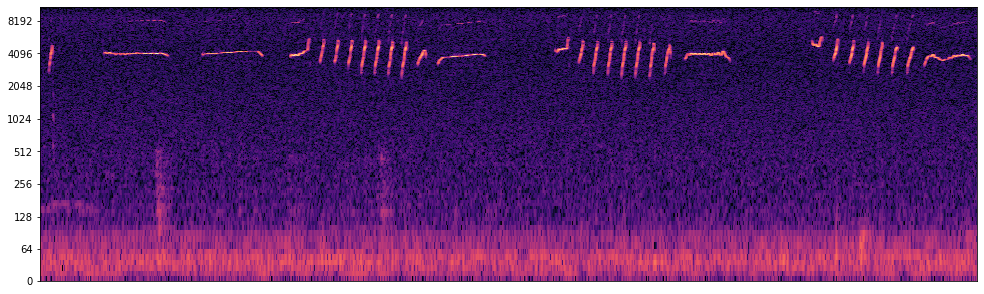

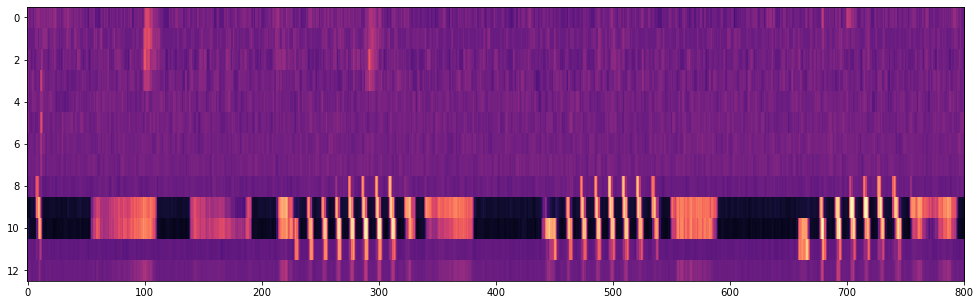

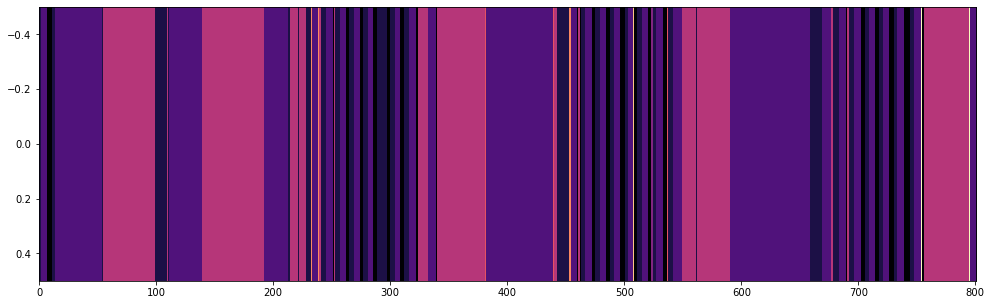

In [21]:
%matplotlib inline
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
print(mel13_feats[utt_key].shape)
# print(mel80_feats[utt_key].shape)

sources = mel13_feats[utt_key] # (num_frames, feat_dim) 
# sources = mel80_feats[utt_key] 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=3 # initial number of clusters
num_iterations = 1500
verbose=True

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mel13 = np.argmax(results['z_posterior'], axis=1)

print(preds_mel13)

# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

utt_key = "1100F_0124_2017_0s_10s"
print(mel13_feats["1100F_0124_2017_0s_10s"].shape)
# print(mfcc13_feats["1100F_0124_2017_0s_10s"].shape)

y, sr = librosa.load(path, sr=48000)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14*1.2, 4.2*1.2))
# draw_spectrogram(spectrogram)
ax = librosa.display.specshow(S_db, cmap='magma', y_axis='log')
plt.gca().set_ylabel(None)# Turn off y labels

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(mel13_feats[utt_key].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(preds_mel13[:,np.newaxis].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

(998, 40)
[4 4 4 4 4 4 4 4 4 4 0 0 0 0 0 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 0 0 4 4 4 4 4 4 4 4 0 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 2 3 3 2 2 2 3 0 3 0 0 0 0 0 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 0 0 0 0 0 0 0 0 2 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 3 0 4 4 4 4 4 4 4 4
 4 4 4 4 0 0 0 2 4 4 4 4 4 4 4 4 4 4 4 1 0 0 2 4 4 4 4 4 4 4 4 4 0 4 0 0 0
 3 0 4 4 4 4 4 4 4 4 4 4 0 0 2 0 4 4 4 0 4 4 4 4 4 4 0 0 0 3 0 0 2 2 4 4 4
 4 4 1 2 0 1 3 0 4 4 4 4 4 4 4 4 0 1 0 1 1 0 4 4 4 4 4 4 4 4 4 4 4 4 0 0 0
 0 0 0 2 0 0 4 4 4 4 4 4 4 4 4 4 4 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 2 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 4 4 4 4
 4 4 4 4 4 4 4 

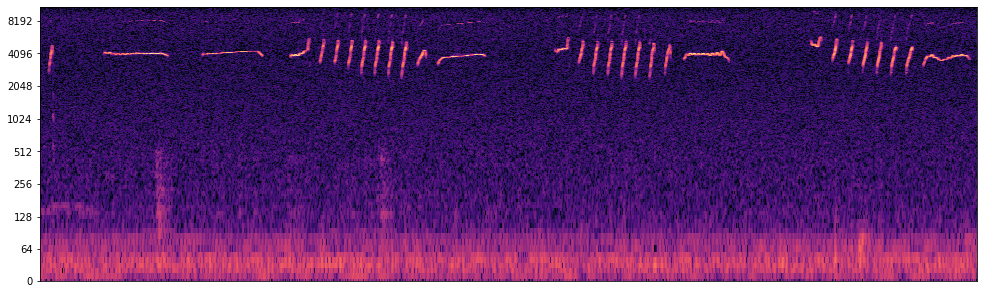

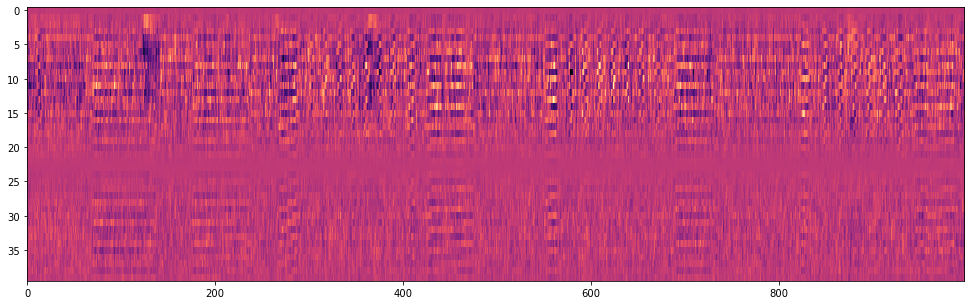

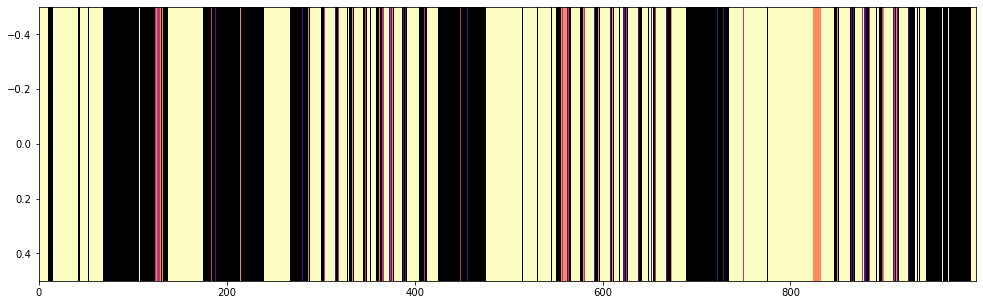

In [211]:
%matplotlib inline
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
print(mfcc40_feats[utt_key].shape)
# print(mel80_feats[utt_key].shape)

sources = mfcc40_feats[utt_key] # (num_frames, feat_dim) 
# sources = mel80_feats[utt_key] 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=5 # initial number of clusters
num_iterations = 1500
verbose=True

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mfcc40 = np.argmax(results['z_posterior'], axis=1)

print(preds_mfcc40)

# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

utt_key = "1100F_0124_2017_0s_10s"
print(mel80_feats["1100F_0124_2017_0s_10s"].shape)
print(mfcc13_feats["1100F_0124_2017_0s_10s"].shape)

y, sr = librosa.load(path, sr=48000)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14*1.2, 4.2*1.2))
# draw_spectrogram(spectrogram)
ax = librosa.display.specshow(S_db, cmap='magma', y_axis='log')
plt.gca().set_ylabel(None)# Turn off y labels

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(mfcc40_feats[utt_key].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(preds_mfcc40[:,np.newaxis].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

(801, 13)
[2 5 0 0 0 0 0 3 2 2 2 1 1 5 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 5 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 5 2 2 2 5 0 0 0 0 0 8 1 1 2 2 2 2 0 0 0 0 0 0 8 1 2 2 2 2 0 0
 0 0 0 6 2 2 2 2 2 2 0 0 0 0 0 2 2 2 2 2 2 5 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 5 0 0 0 0 2 2 2 2 2 2 2 4 0 0 0 0 0 0 2 8 8 8 1 1 1 1 1 1 0
 0 0 0 0 0 0 8 1 1 1 1 1 1 1 1 1 1 1 1 1 8 8 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 2
 2 2 2 2 2 2 2 2 2 7 0 0 0 0 0 9 1 1 6 2 2 2 0 0 0 0 0 0 2 2 2 2 2 4 4 0 0
 0 0 0 2 2 2 2 

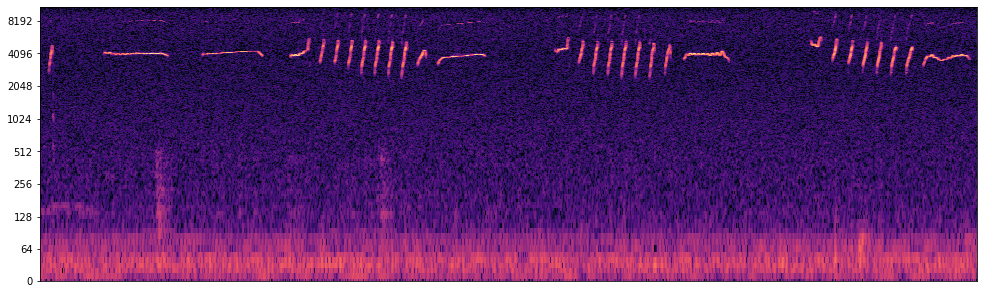

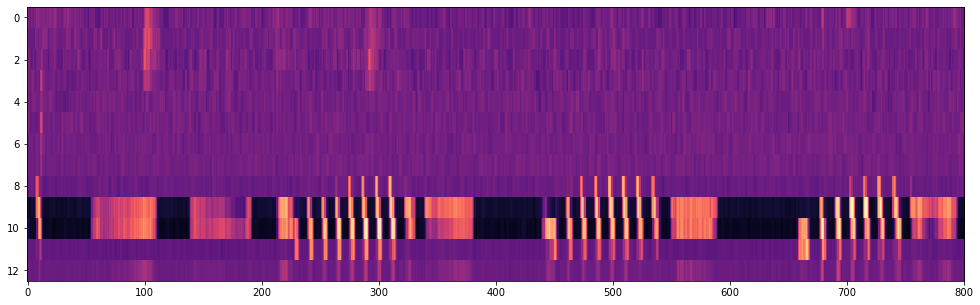

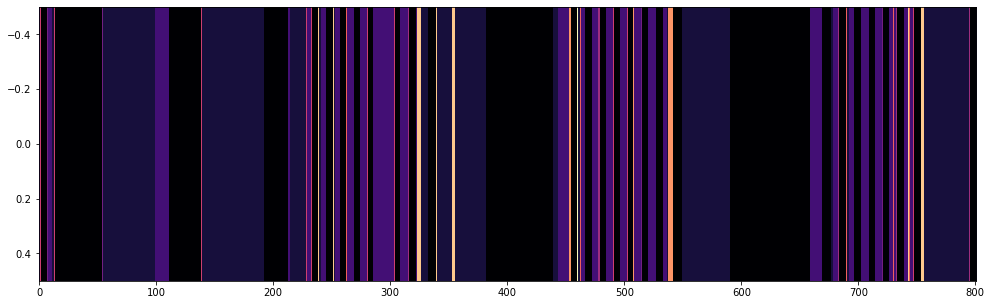

In [210]:
%matplotlib inline
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
print(mel13_feats[utt_key].shape)
# print(mel80_feats[utt_key].shape)

sources = mel13_feats[utt_key] # (num_frames, feat_dim) 
# sources = mel80_feats[utt_key] 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=3 # initial number of clusters
num_iterations = 1500
verbose=True

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mel13 = np.argmax(results['z_posterior'], axis=1)

print(preds_mel13)

# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

utt_key = "1100F_0124_2017_0s_10s"
print(mel13_feats["1100F_0124_2017_0s_10s"].shape)
# print(mfcc13_feats["1100F_0124_2017_0s_10s"].shape)

y, sr = librosa.load(path, sr=48000)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14*1.2, 4.2*1.2))
# draw_spectrogram(spectrogram)
ax = librosa.display.specshow(S_db, cmap='magma', y_axis='log')
plt.gca().set_ylabel(None)# Turn off y labels

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(mel13_feats[utt_key].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(preds_mel13[:,np.newaxis].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

In [202]:
%matplotlib inline
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
# print(mfcc40_feats[utt_key].shape)
print(mel80_feats[utt_key].shape)

# sources = mfcc40_feats[utt_key] # (num_frames, feat_dim) 
sources = mel80_feats[utt_key] 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=3 # initial number of clusters
num_iterations = 1500
verbose=True

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mel80 = np.argmax(results['z_posterior'], axis=1)

(801, 80)


In [203]:
preds_mel80

array([2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 2, 2, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0,
       2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 1,
       1, 2, 1, 1, 2, 0, 0, 0, 0, 0, 1, 1, 2, 0, 0, 1, 0, 0, 0, 0, 0, 2,
       2, 1, 2, 2, 1, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0,

(801, 80)
(998, 13)


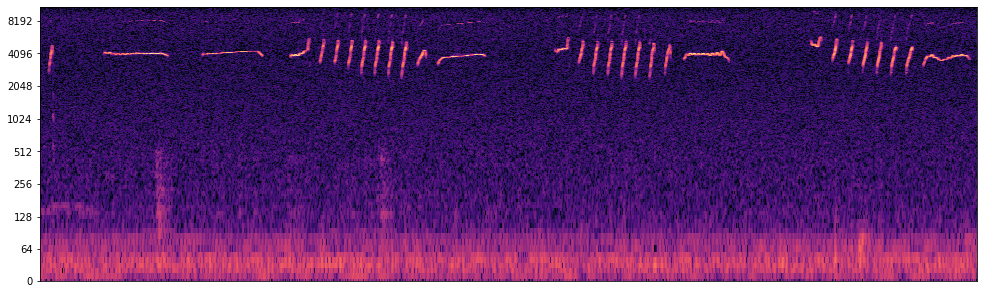

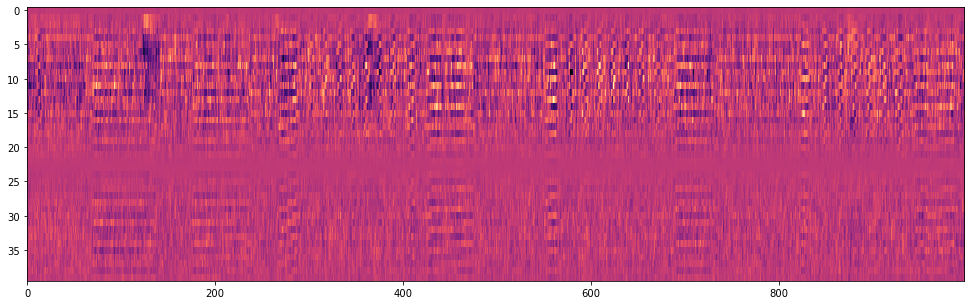

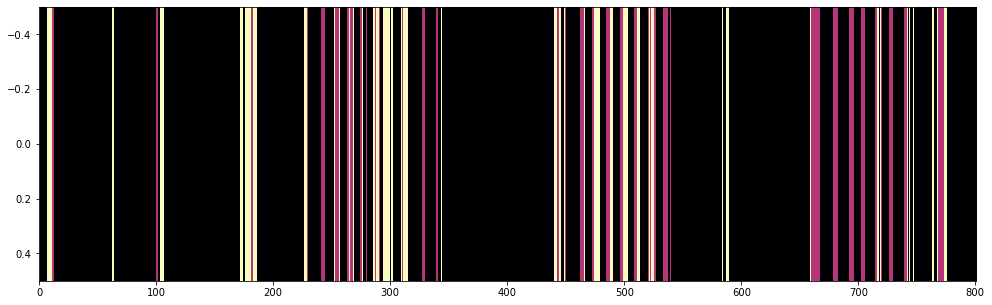

In [204]:
# https://librosa.org/doc/main/auto_examples/plot_display.html
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display

utt_key = "1100F_0124_2017_0s_10s"
print(mel80_feats["1100F_0124_2017_0s_10s"].shape)
print(mfcc13_feats["1100F_0124_2017_0s_10s"].shape)

y, sr = librosa.load(path, sr=48000)
D = librosa.stft(y)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14*1.2, 4.2*1.2))
# draw_spectrogram(spectrogram)
ax = librosa.display.specshow(S_db, cmap='magma', y_axis='log')
plt.gca().set_ylabel(None)# Turn off y labels

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(mfcc40_feats[utt_key].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

plt.figure(figsize=(14*1.2, 4.2*1.2))
ax = plt.imshow(preds_mel80[:,np.newaxis].T, aspect='auto', cmap='magma') # continuous cmap='viridis' discrete cmap='tab20c'

In [182]:
%matplotlib notebook
import logging

import scipy
from sklearn import cluster, datasets
from itertools import cycle, islice

n_samples = 1500
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
sources, targets = blobs[0], blobs[1]

utt_key = "1100F_0124_2017_0s_10s"
print(mel80_feats[utt_key].shape)
print(mfcc40_feats[utt_key].shape)

sources = mel80_feats[utt_key] # (num_frames, feat_dim) 

D = sources.shape[1]
alpha = 1 # concentrate parameter
mu0 = np.mean(sources, axis = 0)
lmbda = 1 # belief of the mean
Sigma0 = np.cov(sources.T) # belief of the covariance
nu = D + 3 # belief of variance or degree of freedom
K0=1 # initial number of clusters
num_iterations = 1500
verbose=True

results = DPGMM3(alpha, mu0, lmbda, Sigma0, nu, sources, K0, num_iterations, verbose)
# preds = results['z']
preds_mel80 = np.argmax(results['z_posterior'], axis=1)

(1500, 2)

(801, 80)
(998, 40)


In [17]:
librosa.feature.delta

<function librosa.feature.utils.delta(data, width=9, order=1, axis=-1, mode='interp', **kwargs)>

In [15]:
D.shape

(1025, 938)

In [19]:
utt_key = "1100F_0124_2017_0s_10s"
print(mel80_feats["1100F_0124_2017_0s_10s"].shape)
print(mel13_feats["1100F_0124_2017_0s_10s"].T.shape)

(801, 80)
(13, 801)


In [31]:
mel13_feats["1100F_0124_2017_0s_10s"][0]

array([ 0.04380051, -0.00595903,  0.01918627,  0.01036408,  0.00713383,
        0.04559018, -0.01774935, -0.01837803, -0.05451202, -0.14464831,
       -0.09450501, -0.04848342, -0.04558443], dtype=float32)

In [62]:
# in kaldi  --delta-window: Parameter controlling window for delta computation (actual window size for each delta order is 1 + 2*delta-window-size) (int, default = 2)
librosa.feature.delta(mel13_feats["1100F_0124_2017_0s_10s"].T, width=5, order=1).T[0]

array([-0.01139438, -0.01035792, -0.01430527, -0.00425729, -0.00584269,
       -0.02073963,  0.00040765, -0.00159419,  0.00294322,  0.00152656,
       -0.01801569, -0.00098483, -0.00077636], dtype=float32)

In [38]:
librosa.feature.delta(mel13_feats["1100F_0124_2017_0s_10s"].T, width=5,order=2).T[0]

array([ 0.0124893 ,  0.01117618,  0.00884475,  0.01521371,  0.01285833,
        0.01721448, -0.00073676,  0.00217113,  0.00073643,  0.00310029,
        0.01325322,  0.00045036, -0.00561649], dtype=float32)

In [32]:
mel39_feats["1100F_0124_2017_0s_10s"][0]

array([ 4.3800510e-02, -5.9590265e-03,  1.9186266e-02,  1.0364078e-02,
        7.1338266e-03,  4.5590177e-02, -1.7749354e-02, -1.8378034e-02,
       -5.4512024e-02, -1.4464831e-01, -9.4505012e-02, -4.8483416e-02,
       -4.5584425e-02, -1.3839027e-02, -1.1860626e-02, -9.9622738e-03,
       -1.0540260e-02, -8.7348409e-03, -1.8478394e-02,  3.2190792e-04,
       -1.4567885e-03,  5.1695947e-04, -1.6273651e-03, -1.6294584e-02,
       -3.7583988e-04,  3.5195476e-03, -3.2782038e-03, -2.8811761e-03,
       -4.0587946e-03, -1.5685065e-03, -2.1012647e-03, -6.0483669e-03,
        1.3202807e-04, -5.2432460e-04,  7.9913298e-04,  3.4432253e-04,
       -5.0811633e-03, -3.2864744e-04, -1.6971328e-04], dtype=float32)

In [69]:
import python_speech_features
python_speech_features.base.delta(mel13_feats["1100F_0124_2017_0s_10s"], N=2)

array([[-0.01383903, -0.01186063, -0.00996227, ..., -0.01629458,
        -0.00037584,  0.00351955],
       [-0.01429207, -0.01363593, -0.01669482, ..., -0.02060078,
        -0.00104395,  0.00190869],
       [-0.01139438, -0.01035792, -0.01430527, ..., -0.01801569,
        -0.00098483, -0.00077636],
       ...,
       [-0.00581546, -0.00118569, -0.01303015, ..., -0.00243407,
         0.00280609, -0.00324891],
       [-0.00609647, -0.00318164, -0.01172342, ..., -0.00281249,
         0.00140186, -0.0050247 ],
       [-0.00112289,  0.00111119, -0.00786418, ..., -0.00242601,
        -0.00046125, -0.00462553]], dtype=float32)

In [97]:
import python_speech_features
feat_delta = python_speech_features.base.delta(mel13_feats["1100F_0124_2017_0s_10s"], N=2)
python_speech_features.base.delta(feat_delta, N=2)

array([[ 4.4362582e-04,  1.2301104e-04, -1.5418546e-03, ...,
        -7.7484100e-04, -1.8860922e-04, -1.0202671e-03],
       [ 1.6056587e-03,  1.8630745e-03,  6.3177978e-04, ...,
         1.3129439e-03, -1.7996044e-04, -1.5255056e-03],
       [ 3.9682365e-03,  3.5886993e-03,  3.0214924e-03, ...,
         4.2203078e-03, -1.1659055e-04, -1.2683844e-03],
       ...,
       [ 6.7639595e-04, -1.6647208e-04, -2.2833105e-03, ...,
         1.2222088e-03, -4.4171454e-04, -1.0506029e-03],
       [ 1.3763322e-03,  1.7474128e-04,  2.4983249e-04, ...,
        -1.9159063e-04, -1.0557974e-03, -7.8933232e-04],
       [ 1.4358703e-03,  8.8865962e-04,  1.4191180e-03, ...,
         4.0258328e-05, -8.3977863e-04, -2.3540747e-04]], dtype=float32)